In [1]:


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns
import folium 
import re
import geopandas as gpd
import missingno
import geopy

pd.set_option('display.max_row' , 100)




/kaggle/input/playground-series-s3e20/sample_submission.csv
/kaggle/input/playground-series-s3e20/train.csv
/kaggle/input/playground-series-s3e20/test.csv


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import folium 
import re
import geopandas as gpd
import missingno
import geopy

pd.set_option('display.max_row' , 100)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
train = pd.read_csv('../input/playground-series-s3e20/train.csv')
test_1 = pd.read_csv('../input/playground-series-s3e20/test.csv')

train.drop('ID_LAT_LON_YEAR_WEEK' , axis = 1 , inplace = True)
test = test_1.drop('ID_LAT_LON_YEAR_WEEK' , axis = 1)

In [4]:
train.head()

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,50.843559,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
1,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,39.137194,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
2,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,52.868816,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
3,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
4,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,35.515587,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


In [5]:
desc = pd.DataFrame(index = list(train))
desc['count'] = train.count()
desc['nunique'] = train.nunique()
desc['null'] = train.isnull().sum()
desc['%nunique'] = desc['nunique'] / len(train) * 100
desc['type'] = train.dtypes

desc = pd.concat([desc , train.describe().T.drop('count' , axis = 1)] , axis = 1)
desc

,count,nunique,null,%nunique,type,mean,std,min,25%,50%,75%,max
latitude,79023,452,0,0.571985,float64,-1.891072,0.694522,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,79023,453,0,0.573251,float64,29.880155,0.810375,28.228000,29.262000,29.883000,30.471000,31.532000
year,79023,3,0,0.003796,int64,2020.000000,0.816502,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
week_no,79023,53,0,0.067069,int64,26.000000,15.297155,0.000000,13.000000,26.000000,39.000000,52.000000
SulphurDioxide_SO2_column_number_density,64414,64409,14609,81.506650,float64,0.000048,0.000272,-0.000996,-0.000096,0.000024,0.000153,0.004191
SulphurDioxide_SO2_column_number_density_amf,64414,64411,14609,81.509181,float64,0.834848,0.185382,0.241822,0.705817,0.809118,0.942792,1.885239
SulphurDioxide_SO2_slant_column_number_density,64414,64409,14609,81.506650,float64,0.000035,0.000206,-0.000887,-0.000078,0.000019,0.000121,0.004236
SulphurDioxide_cloud_fraction,64414,62367,14609,78.922592,float64,0.158418,0.071364,0.000000,0.110535,0.161855,0.211824,0.299998
SulphurDioxide_sensor_azimuth_angle,64414,64295,14609,81.362388,float64,-7.925870,64.263368,-179.537059,-56.782383,-12.441726,72.059990,122.095200
SulphurDioxide_sensor_zenith_angle,64414,64218,14609,81.264948,float64,37.436189,14.149950,0.099237,28.844520,37.784299,47.634875,66.242012


In [6]:
uv_aerosal_layer = [col for col in train.columns if 'UvAerosolLayerHeight' in col]
uv_aerosal_layer

['UvAerosolLayerHeight_aerosol_height',
 'UvAerosolLayerHeight_aerosol_pressure',
 'UvAerosolLayerHeight_aerosol_optical_depth',
 'UvAerosolLayerHeight_sensor_zenith_angle',
 'UvAerosolLayerHeight_sensor_azimuth_angle',
 'UvAerosolLayerHeight_solar_azimuth_angle',
 'UvAerosolLayerHeight_solar_zenith_angle']

In [7]:
desc = pd.DataFrame(index = list(test))
desc['count'] = test.count()
desc['nunique'] = test.nunique()
desc['null'] = test.isnull().sum()
desc['%nunique'] = desc['nunique'] / len(test) * 100
desc['type'] = test.dtypes

desc = pd.concat([desc , test.describe().T.drop('count' , axis = 1)] , axis = 1)
desc

,count,nunique,null,%nunique,type,mean,std,min,25%,50%,75%,max
latitude,24353,452,0,1.856034,float64,-1.891072,0.694532,-3.299000e+00,-2.451000,-1.882000,-1.303000,-0.510000
longitude,24353,453,0,1.860140,float64,29.880155,0.810387,2.822800e+01,29.262000,29.883000,30.471000,31.532000
year,24353,1,0,0.004106,int64,2022.000000,0.000000,2.022000e+03,2022.000000,2022.000000,2022.000000,2022.000000
week_no,24353,49,0,0.201207,int64,24.000000,14.142426,0.000000e+00,12.000000,24.000000,36.000000,48.000000
SulphurDioxide_SO2_column_number_density,18211,18211,6142,74.779288,float64,0.000014,0.000234,-9.771670e-04,-0.000122,0.000007,0.000137,0.004110
SulphurDioxide_SO2_column_number_density_amf,18211,18211,6142,74.779288,float64,0.792570,0.168043,3.398448e-01,0.678384,0.763307,0.872586,1.696826
SulphurDioxide_SO2_slant_column_number_density,18211,18211,6142,74.779288,float64,0.000009,0.000170,-7.745239e-04,-0.000094,0.000004,0.000104,0.002701
SulphurDioxide_cloud_fraction,18211,17149,6142,70.418429,float64,0.139218,0.079865,0.000000e+00,0.078934,0.138999,0.200819,0.299973
SulphurDioxide_sensor_azimuth_angle,18211,18194,6142,74.709481,float64,9.298052,67.148199,-1.068099e+02,-41.627297,16.857963,73.664560,157.503026
SulphurDioxide_sensor_zenith_angle,18211,18194,6142,74.709481,float64,36.174307,14.156478,9.960555e-02,26.577654,37.310447,45.972595,66.243271


<Figure size 3000x1500 with 0 Axes>

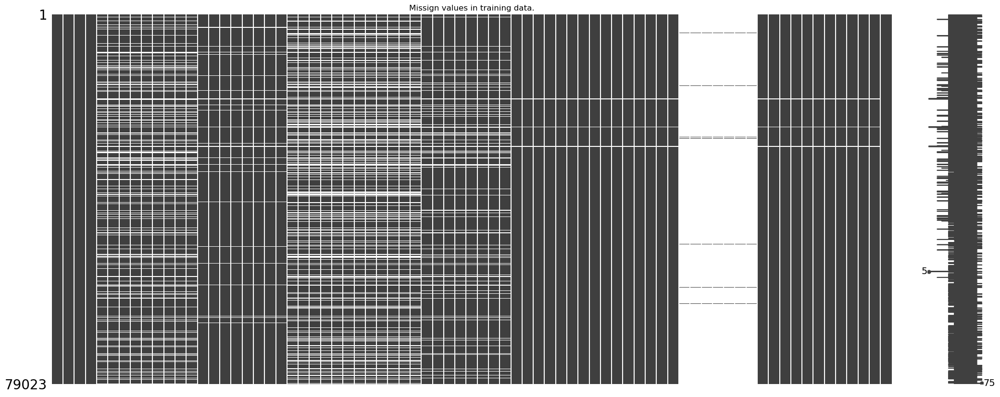

In [8]:
plt.figure(figsize=(10,5) , dpi = 300)

missingno.matrix(train)
plt.title('Missign values in training data.')
plt.show()

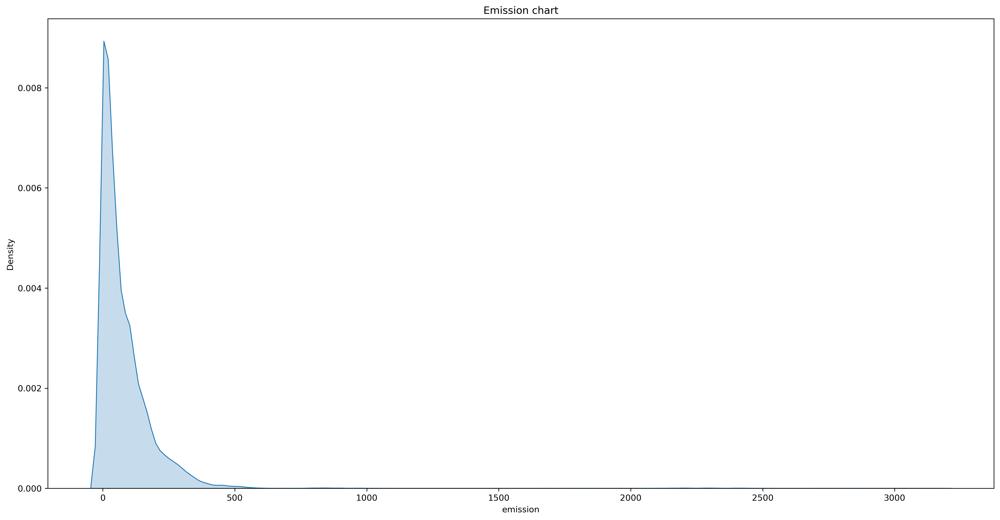

In [9]:
plt.figure(figsize = (20,10) , dpi = 300)
sns.kdeplot(data = train , x = 'emission' , fill = True)
plt.title('Emission chart')
plt.show()

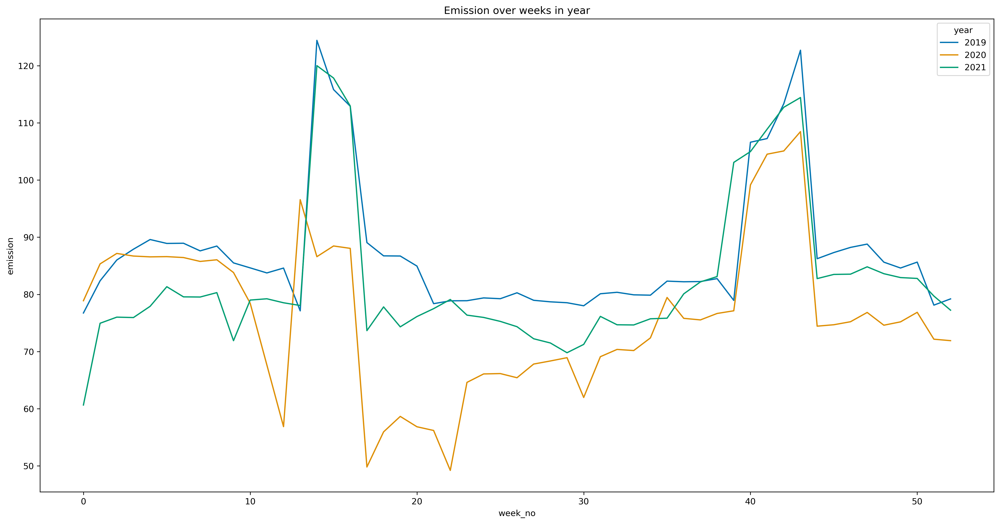

In [10]:
plt.figure(figsize = (20 , 10) , dpi = 300)
sns.lineplot(data = train , x = 'week_no' , y ='emission' , hue = 'year' , errorbar = None , palette = 'colorblind')
plt.title('Emission over weeks in year')
plt.show()

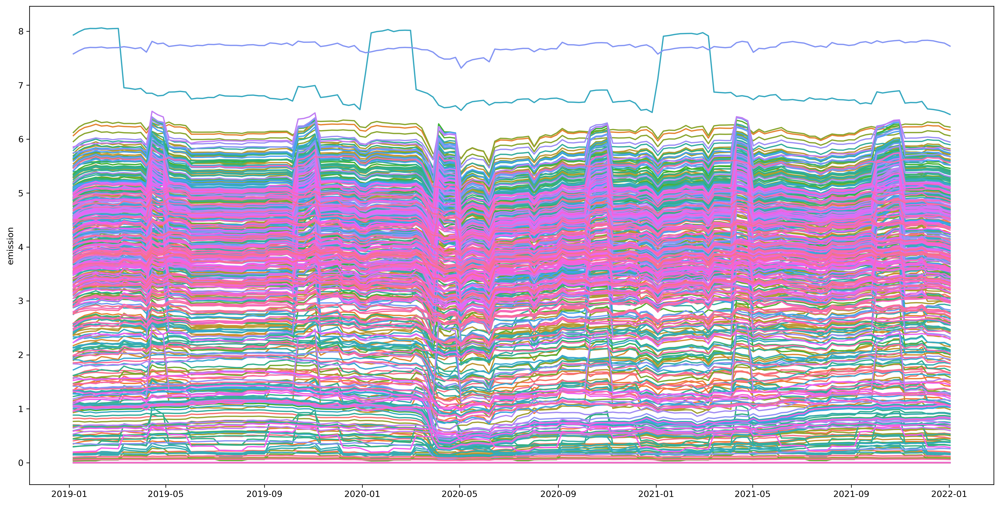

In [11]:
year_week = pd.to_datetime((train.year * 100 + train.week_no).astype('str') + '0' , format='%Y%W%w')
plt.figure(figsize=(20 , 10) , dpi = 300)
sns.lineplot(x = year_week , y = np.log1p(train.emission) , hue = (train.longitude.astype('str')+train.latitude.astype('str')) , errorbar = None )
plt.legend().remove()
plt.show()

In [12]:
def heatmap(dataset , label = None):
    columns = list(dataset)
    correlation = dataset.corr()
    plt.figure(figsize = (14 , 10) , dpi = 300)
    mask = np.zeros_like(correlation)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(correlation , mask = mask , cmap = 'viridis' , linewidth = .1)
    plt.yticks(range(len(columns)) , columns , fontsize = 5 )
    plt.xticks(range(len(columns)) , columns , fontsize = 5 )
    plt.title(f'{label} Dataset Correlation Matrix\n', fontsize = 25, weight = 'bold')
    plt.show()

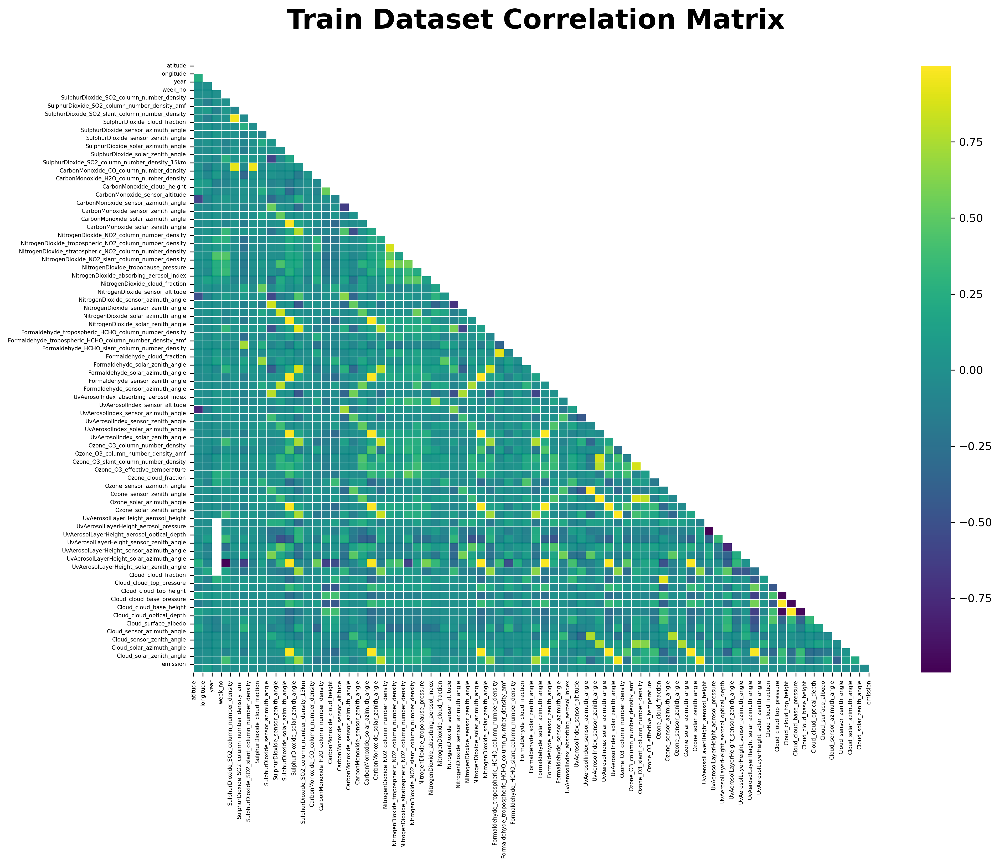

In [13]:
heatmap(train , 'Train')

In [14]:
from scipy.cluster.hierarchy import linkage , dendrogram
from scipy.spatial.distance import squareform

def distance(data , label = ''):
    corr = data.corr(method = 'spearman')
    dist_linkage = linkage(squareform(1 - abs(corr)) , 'complete')
    plt.figure(figsize = (14,10) , dpi = 300)
    dendro = dendrogram(dist_linkage , labels = data.columns , leaf_rotation = 90)
    plt.title(f'Feature Distance in {label} Dataset')
    plt.show()

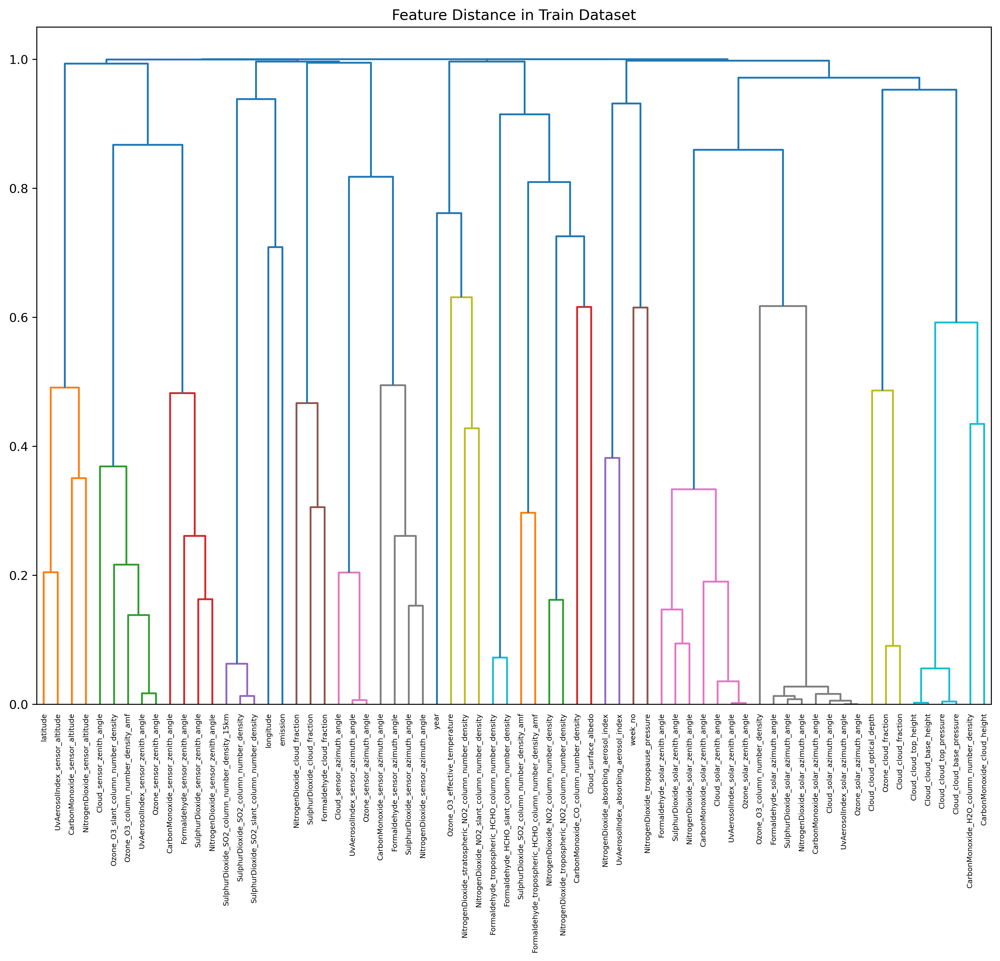

In [15]:
distance(train.drop(uv_aerosal_layer , axis = 1) , 'Train')

In [16]:
train_cord = train.drop_duplicates(subset = ['latitude' , 'longitude'])
geometry = gpd.points_from_xy(train_cord.longitude , train_cord.latitude)
geo_df = gpd.GeoDataFrame(train_cord[['latitude' , 'longitude']] , geometry = geometry)
all_data_map = folium.Map(prefer_canvas = True)
geo_df_lis = [[point.xy[1][0] , point.xy[0][0]] for point in geo_df.geometry]
for coordinates in geo_df_lis:
    all_data_map.add_child(
        folium.CircleMarker(
            location = coordinates,
            radius = 1,
            weight = 4,
            zoom = 10,
            color = 'blue',
            fill_opacity = 0.6,
        ),
    )
all_data_map.fit_bounds(all_data_map.get_bounds())
all_data_map

In [17]:
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

def location_finder():
    location = (train.latitude.astype('str') + ', ' + train.longitude.astype('str')).drop_duplicates().reset_index()
    geolocator = Nominatim(user_agent = 'Danish' , timeout = 10)
    rgeocode = RateLimiter(geolocator.reverse , min_delay_seconds = 1)
    return location[0].apply(rgeocode)
extraction_result = location_finder()

In [18]:
get_country = lambda x : x.raw['address']['country']
get_state = lambda x : x.raw['address']['state']
get_full_address = lambda x : x.raw['display_name']

location = train[['latitude', 'longitude']].drop_duplicates().reset_index().drop('index' , axis = 1)
location['country'] = extraction_result.apply(get_country)
location['state'] = extraction_result.apply(get_state)
location['full_address'] = extraction_result.apply(get_full_address)
location

,latitude,longitude,country,state,full_address
0,-0.510,29.290,République démocratique du Congo,Nord-Kivu,"Taliha, Lubero, Nord-Kivu, République démocrat..."
1,-0.528,29.472,République démocratique du Congo,Nord-Kivu,"Nord-Kivu, République démocratique du Congo"
2,-0.547,29.653,République démocratique du Congo,Nord-Kivu,"Rutshuru, Nord-Kivu, République démocratique d..."
3,-0.569,30.031,Uganda,Mitooma,"Nyakishojwa Central, Mitooma, Western Region, ..."
4,-0.598,29.102,République démocratique du Congo,Nord-Kivu,"Luofu, Lubero, Nord-Kivu, République démocrati..."
...,...,...,...,...,...
492,-3.153,30.347,Burundi,Karuzi,"Karuzi, Burundi"
493,-3.161,28.839,République démocratique du Congo,Sud-Kivu,"Kitoga, Sud-Kivu, République démocratique du C..."
494,-3.174,29.926,Burundi,Karuzi,"Karuzi, Burundi"
495,-3.287,29.713,Burundi,Muramvya,"Gatabo, Muramvya, Burundi"


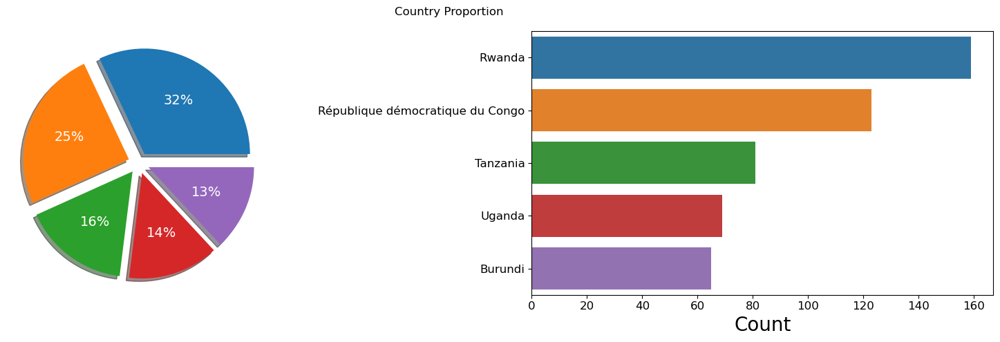

In [19]:
fig , ax = plt.subplots(1 , 2 , figsize = (16 , 5))

ax = ax.flatten()

ax[0].pie(
    location['country'].value_counts(),
    shadow = True,
    explode = [.1 for i in range(0,5)],
    autopct = '%1.f%%',
    textprops = {'size':14 , 'color':'white'}
)

sns.countplot(data = location , y = 'country' , ax = ax[1] , order = location['country'].value_counts().index)
ax[1].yaxis.label.set_size(20)
plt.yticks(fontsize = 12)
ax[1].set_xlabel('Count' , fontsize = 20)
ax[1].set_ylabel(None)
plt.xticks(fontsize = 12)
fig.suptitle('Country Proportion ')
plt.tight_layout()

In [20]:
from sklearn.model_selection import LeaveOneGroupOut , GroupKFold

X = train.copy()
y = X.pop('emission')
seed = 42
k = LeaveOneGroupOut()
np.random.seed(seed)

In [21]:
from sklearn.preprocessing import FunctionTransformer , MinMaxScaler , StandardScaler , PowerTransformer

def feature_droper(X):
    return X[['longitude' , 'latitude' , 'week_no' , 'is_covid']]
FeatureDroper = FunctionTransformer(feature_droper)

In [22]:
def date_processor(x):
    x_copy = x.copy()
    year_week = pd.to_datetime((x_copy.year * 100 + x_copy.week_no).astype('str') + '0' , format = '%Y%W%w')
    x_copy['month'] = year_week.dt.month
    x_copy['is_covid'] = (x_copy.year == 2000)&(x_copy.week_no > 8)
    return x_copy
DateProcessor = FunctionTransformer(date_processor)

In [23]:
from sklearn.metrics import mean_squared_error, roc_auc_score, roc_curve
def cross_val_score(model , cv = k , label = ''):
    X = train.copy()
    y = X.pop('emission')
    
    val_predictions = np.zeros((len(train)))
    train_scores , val_scores = [] , []
    
    for fold , (train_idx , val_idx) in enumerate(cv.split(X,y,X.year)):
        X_train = X.iloc[train_idx]
        y_train = y.iloc[train_idx]
        
        X_val = X.iloc[val_idx]
        y_val = y.iloc[val_idx]
        
        model.fit(X_train , y_train)
        
        train_pred = model.predict(X_train)
        val_pred = model.predict(X_val)
        
        val_predictions[val_idx] += val_pred
        
        train_score = mean_squared_error(y_train , train_pred , squared = False)
        val_score = mean_squared_error(y_val , val_pred , squared = False)
        
        train_scores.append(train_score)
        val_scores.append(val_score)
        
    print(f'Val Score: {np.mean(val_scores):.5f} ± {np.std(val_scores):.5f} | Train Score: {np.mean(train_scores):.5f} ± {np.std(train_scores):.5f} | {label}')
    return val_scores , val_predictions


In [24]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, GradientBoostingRegressor

score_list , oof_list = pd.DataFrame() , pd.DataFrame()

models = [
    ('rf' , RandomForestRegressor(random_state = seed)),
    ('et' , ExtraTreesRegressor(random_state = seed)),
    ('xgb' , XGBRegressor(random_state = seed)),
    ('lgb' , LGBMRegressor(random_state = seed)),
    ('cb' , CatBoostRegressor(random_state = seed , verbose = 0)),
]

In [25]:
from sklearn.pipeline import Pipeline, make_pipeline
for label , model in models:
    score_list[label] , oof_list[label] = cross_val_score(
        make_pipeline(DateProcessor , FeatureDroper , model),
        label = label
    )

Val Score: 22.08903 ± 3.50400 | Train Score: 13.06786 ± 2.14506 | rf
Val Score: 22.39860 ± 3.35713 | Train Score: 12.89442 ± 2.17330 | et
Val Score: 24.11724 ± 2.33795 | Train Score: 17.53880 ± 1.69443 | xgb
Val Score: 30.62857 ± 2.27781 | Train Score: 27.30416 ± 1.17153 | lgb
Val Score: 26.77811 ± 1.61828 | Train Score: 21.75175 ± 1.31635 | cb


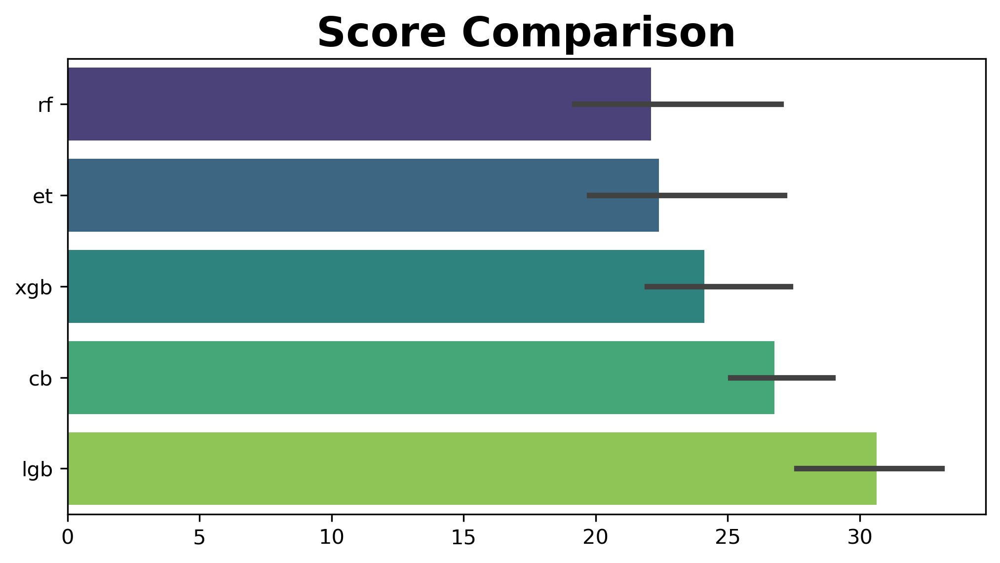

In [26]:
plt.figure(figsize=(8,4) , dpi = 300)
sns.barplot(data = score_list.reindex((score_list).mean().sort_values().index , axis = 1) , palette = 'viridis' , orient = 'h')
plt.title('Score Comparison', weight = 'bold', size = 20)
plt.show()

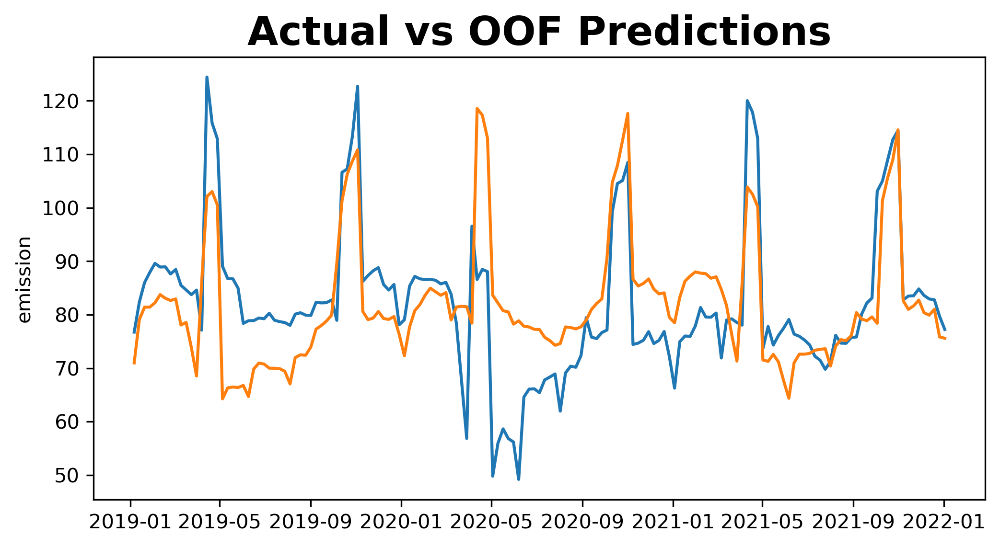

In [27]:
plt.figure(figsize=(8,4) , dpi = 300)

sns.lineplot(x = year_week , y = train.emission , errorbar = None)
sns.lineplot(x = year_week , y = oof_list.rf , errorbar = None)

plt.title('Actual vs OOF Predictions', weight = 'bold', size = 20)
plt.show()

In [28]:
from sklearn.linear_model import Ridge, Lasso
weights = Ridge(random_state = seed).fit(oof_list , y).coef_
pd.DataFrame(weights , index = oof_list.columns , columns = ['weight per model'])

,weight per model
rf,1.707677
et,-0.850331
xgb,0.088365
lgb,0.095732
cb,-0.039942


In [29]:
from sklearn.ensemble import HistGradientBoostingRegressor, VotingRegressor, StackingRegressor, AdaBoostRegressor
voter = make_pipeline(
    DateProcessor,
    FeatureDroper,
    VotingRegressor(models, weights = weights)
)

_ = cross_val_score(voter)

Val Score: 21.89418 ± 3.37054 | Train Score: 13.76584 ± 2.06885 | 


In [30]:
voter.fit(X, y)
prediction = voter.predict(test) * 1.05

In [31]:
test_1.drop(list(test_1.drop('ID_LAT_LON_YEAR_WEEK', axis = 1)), axis = 1, inplace = True)

test_1['emission'] = prediction
test_1.to_csv('submission.csv', index = False)

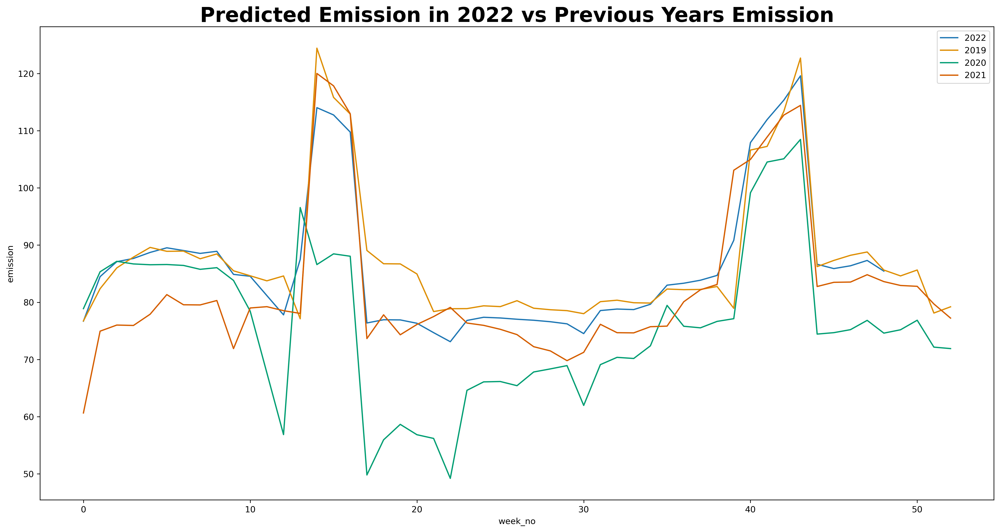

In [32]:
pal = sns.color_palette('colorblind')
plt.figure(figsize = (20, 10), dpi = 300)

sns.lineplot(x = test.week_no, y = test_1.emission, errorbar = None)
sns.lineplot(x = train.week_no, y = train.emission, hue = train.year, errorbar = None, palette = [pal[1], pal[2], pal[3]])

plt.legend([2022, 2019, 2020, 2021])
    
plt.title('Predicted Emission in 2022 vs Previous Years Emission', fontsize = 24, fontweight = 'bold')
plt.show()

In [33]:
test['emission'] = prediction
train = pd.concat([train, test])

test_1.emission = np.max([train[(train.year == y) & (train.week_no < 49)].emission for y in range(2019, 2022)], axis=0)
test_1.to_csv('hacky_submission.csv', index = False)

In [3]:
from catboost import CatBoostRegressor
CatBoostRegressor()